# Compile at the beginning

In [153]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.interpolate import griddata
from collections import Counter
from scipy.optimize import minimize
from scipy.optimize import fsolve, minimize
from gekko import GEKKO


def kl_divergence(p, q):
    """Calculate the Kullback-Leibler divergence between two probability distributions."""
    epsilon = 1e-6  # Small constant to avoid log(0)
    return np.sum(p * np.log((p) / (q + epsilon)), axis=1)

#Cross-Entropy
def ent(p, q):
    """Calculate some form of entropy measure between p and q; define accordingly."""
    return np.sum(-p * np.log(q + 1e-10), axis=1) 

def renyi(p, q, alpha):
    """Computes the Rényi divergence between two probability distributions."""
    if alpha == 1:
        return kl_divergence(p, q)
    elif alpha == 0:
        return ent(p, q)
    else:
        return (1 / (alpha - 1)) * np.log(np.sum(np.power(p, alpha) * np.power(q, 1 - alpha), axis=1))


#Projecting a point (probabilty mass) into 2-d probabilty simplex
def proj(p):
    """
    This function projects a point (probability mass) into a 2D probability simplex.
    It converts the original mesh grid which was on the z=0 plane, to a probability simplex.
    """
    # Initialize dummy array and basis vectors
    dummy = np.array([0, 0, 0], dtype='float64')
    bias = np.array([1/3, 1/3, 1/3], dtype='float64')
    basis1 = np.array([-1/np.sqrt(2), 1/np.sqrt(2), 0])
    basis2 = np.array([-1/np.sqrt(6), -1/np.sqrt(6), np.sqrt(2/3)])

    # Assign values to dummy array
    dummy[0], dummy[1], dummy[2] = p[0], p[1], 1 - p[0] - p[1]
    dummy -= bias

    # Project the point onto the simplex
    proj_x = np.dot(dummy, basis1)
    proj_y = np.dot(dummy, basis2)

    return np.array([proj_x, proj_y])

In [148]:
# Reference probability distribution p
p = np.array([0.2, 0.3, 0.5])
q = np.array([2/3, 1/9, 2/9])

#project p into simplex
pp = proj(p)
p1 = pp[0]
p2 = pp[1]

#project q into simplex
qq = proj(q)
q1 = qq[0]
q2 = qq[1]

n=500
# Generate points in the simplex
def generate_points_in_simplex(n):
    # Generate points in the simplex
    x = np.linspace(0, 1, n)
    y = np.linspace(0, 1, n)
    X, Y = np.meshgrid(x, y)
    Xp = np.zeros_like(X)
    Yp = np.zeros_like(X)
    
    return X, Y, Xp, Yp

# Use the function
X, Y, Xp, Yp = generate_points_in_simplex(n)


#Different alphas for renyi entropy
alpha1 = 0.5
alpha2 = 5
alpha3 = 20
alpha4 = 40

#Delta or the upper bound of D_{KL}(phi || p) \leq radiuts
radius = 0.1



# Converting original mesh grid which was on z=0 plane, to probabilty simplex with some boring linear algebra!
dummy = np.array([0, 0, 0], dtype='float64')
bias = np.array([1/3, 1/3, 1/3], dtype='float64')
basis1 = np.array([-1/np.sqrt(2), 1/np.sqrt(2), 0])
basis2 = np.array([-1/np.sqrt(6), -1/np.sqrt(6), np.sqrt(2/3)])
for i in range(n):
    for j in range(n):
      dummy[0], dummy[1], dummy[2] = X[i, j], Y[i, j], 1 - X[i, j] - Y[i, j]
      dummy -= bias
      Xp[i, j] = np.dot(dummy, basis1)
      Yp[i, j] = np.dot(dummy, basis2)


def calculate_divergences(X, Y, p, alpha):
    # Initialize divergence arrays
    Zs = [np.full_like(X, np.nan) for _ in alpha]
    
    # Calculate divergences where X + Y <= 1
    mask = X + Y <= 1
    q_ = np.stack([X[mask], Y[mask], 1 - X[mask] - Y[mask]], axis=-1)

    for i, alpha in enumerate(alpha):
        Zs[i][mask] = renyi(q_, p, alpha)

    return Zs

# Use the functionc
alphas = [alpha1, alpha2, alpha3, alpha4, 1]
Zs = calculate_divergences(X, Y, p, alphas)


def calculate_mismatched_tilt(p, q, alpha):
    return p* (q**alpha) / np.sum(p* (q**alpha))


A = np.exp(np.arange(-6, 3, 0.0001))
T_pq_x = []
T_pq_y = []
for a_ in A:
    t_pq = p * (q**a_)
    t_pq /= np.sum(t_pq)
    t_pq_ = proj(calculate_mismatched_tilt(p, q, a_))
    T_pq_x.append(t_pq_[0])
    T_pq_y.append(t_pq_[1])

def objective(alpha):
    t_qp_alpha = calculate_mismatched_tilt(p, q, alpha)
    return renyi(t_qp_alpha.reshape(1, -1), p, 1)[0] - delta

# Initial guess
alpha_initial = 0.5
# Solve for alpha
solution = fsolve(objective, alpha_initial)
tilted = calculate_mismatched_tilt(p, q, solution)
tilt_special = proj(tilted)

/var/folders/zy/53q03bqx77bflc8psn3qmjrm0000gn/T/ipykernel_37728/2838114025.py:13: RuntimeWarning:

divide by zero encountered in log

/var/folders/zy/53q03bqx77bflc8psn3qmjrm0000gn/T/ipykernel_37728/2838114025.py:13: RuntimeWarning:

invalid value encountered in multiply



In [20]:
print("tilt_special", ent(tilt_special, q))
print("renyi", ent(optimized_phi, q))
print("Best-Of-N", ent(type_bon_, q))

tilt_special 1.2043443676419536
renyi 1.2909747250132555
Best-Of-N 0.28715504905514055


In [74]:
categories = ['0', '1', '2']

q_ = proj(q)
# draw 1000 samples
Ns = np.ceil(np.exp(np.arange(2, 3, 2)))
m = 10
K = 80000

for N in Ns:
  type_bon = [0, 0, 0]
  for j in range(int(np.ceil(K/N))):
    draws = []
    logprobs = []
    for i in range(int(N)):
      draw_ = Counter(np.random.choice(categories, m, p=p))
      draws.append(draw_)
      logprob_ = draw_['0'] * np.log(q[0]) + draw_['1'] * np.log(q[1]) + draw_['2'] * np.log(q[2])
      logprobs.append(logprob_)
    index_max = max(range(len(logprobs)), key=logprobs.__getitem__)


    draw_bon = draws[index_max]
    draw_bon_type = [draw_bon['0'], draw_bon['1'], draw_bon['2']]
    draw_bon_ = proj(draw_bon_type)
    type_bon = [type_bon[0] + draw_bon['0'], type_bon[1] + draw_bon['1'], type_bon[2] + draw_bon['2']]
type_bon_ = proj(type_bon/np.sum(type_bon))

# Plotting Section

## Plotting with Matplotlib (Ugly!)

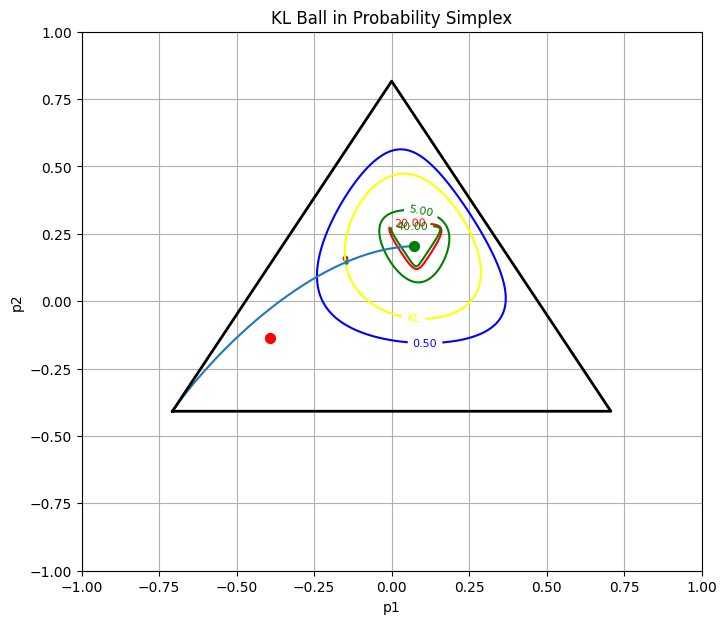

In [100]:
###Plotting phase/

# Plot the probability simplex and the KL ball for the different values of alpha
plt.figure(figsize=(8, 7))
contour = plt.contour(Xp, Yp, Zs[0], levels=[radius], colors='blue')
contour2 = plt.contour(Xp, Yp, Zs[1], levels=[radius], colors='green')
contour3 = plt.contour(Xp, Yp, Zs[2], levels=[radius], colors='red')
contour4 = plt.contour(Xp, Yp, Zs[3], levels=[radius], colors='green')
contour5 = plt.contour(Xp, Yp, Zs[4], levels=[radius], colors = 'yellow')

plt.plot(T_pq_x, T_pq_y)
# Note that in the plot below, origin is the center of simplex
plt.plot([-np.sqrt(2)/2, +np.sqrt(2)/2, 0, -np.sqrt(2)/2], [-1/np.sqrt(6), -1/np.sqrt(6),np.sqrt(2/3) , -1/np.sqrt(6)], 'k-', lw=2)  # Draw the simplex
plt.scatter([p1], [p2], color='green', s=50, zorder=3)  # scatter the original p
plt.scatter([q1], [q2], color='red', s=50, zorder=3)  # scatter the original p
plt.scatter([tilt_special[0]], [tilt_special[1]], s=5, zorder=3)  # scatter the original p
plt.scatter([type_bon_[0]], [type_bon_[1]], s=10,marker="o", color="brown")

# plt.text(alpha1, alpha2*1.1, 'p', ha='center', va='center', fontsize=6)

plt.title('KL Ball in Probability Simplex')
plt.xlabel('p1')
plt.ylabel('p2')
plt.grid(True)
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.clabel(contour, inline=True, fontsize=8, fmt="{:.2f}".format(alpha1))
plt.clabel(contour2, inline=True, fontsize=8, fmt="{:.2f}".format(alpha2))
plt.clabel(contour3, inline=True, fontsize=8, fmt="{:.2f}".format(alpha3))
plt.clabel(contour4, inline=True, fontsize=8, fmt="{:.2f}".format(alpha4))
plt.clabel(contour5, inline=True, fontsize=8, fmt="KL")
plt.show()

## Plotting With plotly (Recommended)

In [152]:
def generate_contours_and_paths(Xp, Yp, Z, level, color):
    # Generate contours using matplotlib
    contour = plt.contour(Xp, Yp, Z, levels=[level], colors=color)
    # Extract contour paths
    paths = [path.vertices for seg in contour.collections[0].get_paths() for path in [seg]]
    plt.close()  
    return paths

Z_entropy = calculate_divergences(X, Y, q, [0])[0]
# Define levels, colors and Z values
levels_colors_Z = [(Zs[0], radius, 'blue'), (Zs[1], radius, 'green'), (Zs[2], radius, 'red'), (Z_entropy, renyi(tilted.reshape(1, -1), q, 0)[0], None), (Zs[3], radius, None), (Zs[4], radius, None)]

# Generate contours and paths for each level, color and Z
paths_all = [generate_contours_and_paths(Xp, Yp, Z, level, color) for Z, level, color in levels_colors_Z]

/var/folders/zy/53q03bqx77bflc8psn3qmjrm0000gn/T/ipykernel_37728/3231865341.py:5: MatplotlibDeprecationWarning:

The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.



<a list of 50 text.Text objects>

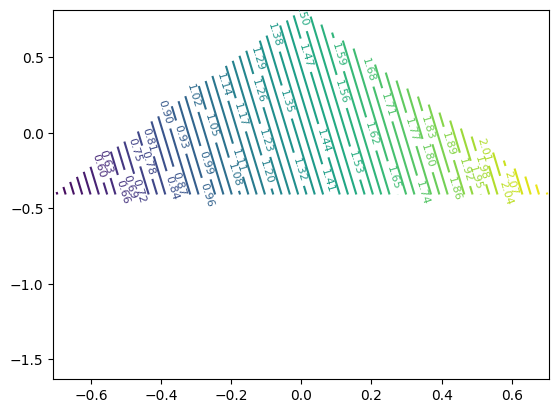

In [218]:
contours = plt.contour(Xp, Yp, Z_entropy, levels = 60)
plt.clabel(contours, inline=True, fontsize=8)  # Label the contours


In [215]:
fig = go.Figure()


def add_trace(fig, paths, color, name):
    for path in paths:
        fig.add_trace(go.Scatter(x=path[:, 0], y=path[:, 1], mode='lines', name=name, line=dict(color=color)))

# Define colors, names and Z values
colors_names_Z = [('blue', f"{alphas[0]}", paths_all[0]), ('green', f"{alphas[1]}", paths_all[1]), 
                  ('red', f"{alphas[2]}", paths_all[2]), ('orange', 'Linear Family', paths_all[3]), 
                  ('purple', f"{alphas[3]}", paths_all[4]), ('black', 'KL', paths_all[5])]

# Add traces for each color, name and Z
for color, name, paths in colors_names_Z:
    add_trace(fig, paths, color, name)

# Add scatter points and lines
fig.add_trace(go.Scatter(x=T_pq_x, y=T_pq_y, mode='lines', line=dict(color='blue'), name = "Exponential Family"))
fig.add_trace(go.Scatter(x=[-np.sqrt(2)/2, +np.sqrt(2)/2, 0, -np.sqrt(2)/2],
                         y=[-1/np.sqrt(6), -1/np.sqrt(6), np.sqrt(2/3), -1/np.sqrt(6)],
                         mode='lines', line=dict(color='black', width=2)))

gaga = proj(optimized_phi)
fig.add_trace(go.Scatter(x=[p1], y=[p2], mode='markers', marker=dict(color='green', size=10), name='P'))
fig.add_trace(go.Scatter(x=[q1], y=[q2], mode='markers', marker=dict(color='red', size=10), name='Q'))
fig.add_trace(go.Scatter(x=[tilt_special[0]], y=[tilt_special[1]], mode='markers', marker=dict(color='black', size=10), name='Exact tilted distirbution on the KL Contour'))
fig.add_trace(go.Scatter(x=[type_bon_[0]], y=[type_bon_[1]], mode='markers', marker=dict(color='brown', size=10), name='Best-Of-N'))
# fig.add_trace(go.Scatter(x=[gaga[0]], y=[gaga[1]], mode='markers', marker=dict(color='yellow', size=10), name='Libraray'))



fig.add_trace(go.Scatter(x=a[:,0], y=a[:, 1], mode='lines', name = 'Set of Renyi solutions'))


# for i in range(len(solutions1)):
#     temp = proj(solutions1[i])
#     fig.add_trace(go.Scatter(x=[temp[0]], y=[temp[1]], mode='markers', marker=dict(size=10), showlegend=False))
        
# Update layout to mimic plt features
fig.update_layout(
    plot_bgcolor='white',
    title='KL Ball in Probability Simplex',
    width = 1000,
    height = 600,
    xaxis_title='p1',
    yaxis_title='p2'
)

# Setting the plot bounds
fig.update_xaxes(range=[-1, 1])
fig.update_yaxes(range=[-1, 1])

# remove the grid from both axes
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)

fig.write_html('sample_figure.html')
fig.show()

array([-0.48065737, -0.01602641])

In [155]:
def closed_form(alpha):
    # Constants
    
    # Initialize Gekko model
    m = GEKKO(remote=False)
    
    # Variables (phi_i >= 0 and sum to 1)
    phi = [m.Var(value=1/d, lb=0, ub=1) for _ in range(d)]
    
    # Constraint: sum(phi) == 1
    m.Equation(sum(phi) == 1)
    
    # Objective function: sum(phi * log(1/q))
    obj = sum([phi[i] * m.log(1/q[i]) for i in range(d)])
    m.Minimize(obj)
    
    # Define alpha-Rényi divergence and add as a constraint (div <= delta)
    # First, compute the Rényi divergence term
    renyi_div = sum([(phi[i] ** alpha) * (p[i]**(1-alpha)) for i in range(d)])
    renyi_div = (1/(alpha-1)) * m.log(renyi_div)
    
    # Constraint: Rényi divergence <= delta
    m.Equation(renyi_div <= radius)
    
    # Solve the optimization
    m.options.SOLVER = 1  # APOPT solver
    m.solve(disp=True)
    
    # Print the results
    optimized_phi = [phi[i].value[0] for i in range(d)]
    return optimized_phi
    # print("Optimized distribution:", optimized_phi)
    # print("Rényi divergence of the solution:", renyi_div.value[0])

In [172]:
solutions = []
for alpha in np.linspace(1.0001, 40, 600):
    solutions.append(closed_form(alpha))

 ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            4
   Intermediates:            0
   Connections  :            0
   Equations    :            3
   Residuals    :            3
 
 Number of state variables:              4
 Number of total equations: -            2
 Number of slack variables: -            1
 ---------------------------------------
 Degrees of freedom       :              1
 
 ----------------------------------------------
 Steady State Optimization with APOPT Solver
 ----------------------------------------------
 
 Iter    Objective  Convergence
    0  8.98052E-01  3.63191E-06
    1  4.05629E-01  5.01474E-05
    2  8.23950E-01  1.84138E-04
    3  4.04741E+00  1.59497E-04
    4  

In [209]:
a = np.array([proj(_) for _ in solutions])
b = np.array([_ for _ in solutions])

In [212]:
rewards = [renyi(_.reshape(1, -1),q,0)[0] for _ in b]

In [213]:
rewards

[1.2043544204205594,
 1.213784498072581,
 1.2223482270936195,
 1.2301661249815137,
 1.2373367695274748,
 1.2439416412489992,
 1.2500487277081405,
 1.2557152452657183,
 1.260989722327582,
 1.2659136125819956,
 1.270522558663675,
 1.2748473917659011,
 1.2789149297331444,
 1.2827486201430474,
 1.2863690620139656,
 1.2897944329427635,
 1.2930408404957738,
 1.2961226137845723,
 1.299052546444877,
 1.30184210043314,
 1.3045015779749192,
 1.3070402670836634,
 1.3094665656383586,
 1.3117880873565326,
 1.314011752864273,
 1.3161438682283988,
 1.318190192937172,
 1.320155998917685,
 1.3220461219077428,
 1.323865006698688,
 1.3256167462693214,
 1.327305116915285,
 1.3289336085258543,
 1.3305054519693202,
 1.3320236430261234,
 1.3334909638305121,
 1.3349100018633395,
 1.3362831671447426,
 1.3376127073026904,
 1.3389007214139907,
 1.3401491722795082,
 1.3413598974294558,
 1.3425346193300989,
 1.3436749542076518,
 1.3447824204178294,
 1.3458584458452183,
 1.3469043746968508,
 1.347921473562582,
 1.3

In [196]:
solutions1 = []
for alpha in np.linspace(0.29, 0.86, 60):
    solutions1.append(closed_form(alpha))

 ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            4
   Intermediates:            0
   Connections  :            0
   Equations    :            3
   Residuals    :            3
 
 Number of state variables:              4
 Number of total equations: -            2
 Number of slack variables: -            1
 ---------------------------------------
 Degrees of freedom       :              1
 
 ----------------------------------------------
 Steady State Optimization with APOPT Solver
 ----------------------------------------------
 
 Iter    Objective  Convergence
    0  5.73111E-01  7.98213E-02
    1  5.73111E-01  1.11022E-16
    2  5.73111E-01  1.11022E-16
 Successful solution
 
 ---------------

# Tail Behavious

In [ ]:
alphabet_size = 50000
alphabet = [i for i in range(alphabet_size)]

#Defining P
mean = 20
std_dev = 5
p = np.random.normal(loc=mean, scale=std_dev, size=alphabet_size)
p = np.abs(p)  # Ensure there are no negative values
p /= p.sum()

#Defining Q
mean2 = 50
std_dev2 = 3
q = np.random.normal(loc=mean2, scale=std_dev2, size=alphabet_size)
q = np.abs(q)  # Ensure there are no negative values
q /= q.sum()

## Optimziation Problem Closed-Form

In [ ]:
# Closed form solution of alpha from Optimization Problem
alpha = 2
phi = p * (q**alpha)
phi /= np.sum([phi])

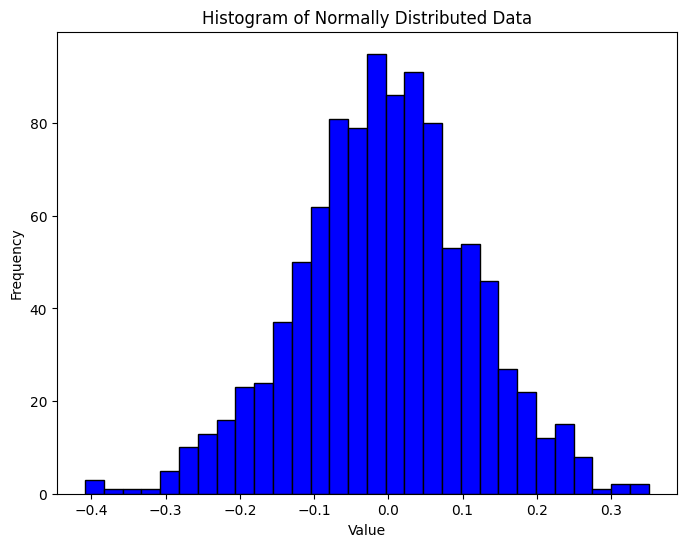

In [ ]:
#Sampling 1000 points from alphabet
m = 1000
sampling = np.random.choice(alphabet, m, p=phi)

# Compute the histogram
hist, bin_edges = np.histogram(np.log(phi[sampling]/p[sampling]), bins=30)

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.bar(bin_edges[:-1], hist, width = bin_edges[1] - bin_edges[0], color='blue', edgecolor='black')
plt.title('Histogram of Normally Distributed Data')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

## Best-of-N Closed Form

In [ ]:
#Reward Function
def r(x, y):
    return x * np.log(y)

###Based on paper Definitions###
def compute_F(x, y, Z):
    # Compute F(y|x)
    rewards = r(x, Z)
    return np.mean(rewards <= r(x, y))
def compute_F_minus(y, x, Z):
    # Compute F^-(y|x)
    rewards = r(x, Z)
    return np.mean(rewards < r(x, y))
##################################


def compute_pi_n(y, x, Z, n):
    # Compute pi^(n)_(y|x)(y|x)
    F_xy = compute_F(x, y, Z)
    F_minus_xy = compute_F_minus(x, y, Z)
    return F_xy**n - F_minus_xy**n


# Example usage
x = 2  # Example value for x
y = 3  # Example value for y
Z = np.random.normal(0, 1, 1000)  # Example distribution of Z
n = 5  # Example n

pi_n = compute_pi_n(y, x, Z, n)
print("π^(n)_(y|x)(y|x) =", pi_n)

In [6]:
from scipy.optimize import minimize, Bounds, NonlinearConstraint

# Constants
d = 3
p = np.array([0.2, 0.3, 0.5])
q = np.array([2/3, 1/9, 2/9])
delta = 0.1  # Tolerance for KL divergence
epsilon = 1e-8  # Small number to avoid log(0)
alpha = 2

# Objective function
def objective(phi):
    return np.sum(phi * np.log((1) / (q + epsilon)))

# Define another function according to the definition of renyi function which was defined earlier

# KL divergence constraint
def kl_divergence_constraint(phi):
    return np.sum(phi * np.log(phi / (p + epsilon))) - delta

def renyi(phi):
  """Computes the Rényi divergence between two probability distributions.

  Args:
    p: A numpy array representing the first probability distribution.
    q: A numpy array representing the second probability distribution.
    alpha: The order of the Rényi divergence.

  Returns:
    The Rényi divergence between the two probability distributions.
  """

  if alpha == 1:
    return kl_divergence(phi, p)
  else:
    return (1 / (alpha - 1)) * np.log(np.sum(np.power(phi, alpha) * np.power(p, 1 - alpha)))



# Constraints and bounds
# constraints = [
#     {'type': 'eq', 'fun': lambda phi: np.sum(phi) - 1},  # Sum to 1
#     {'type': 'ineq', 'fun': kl_divergence_constraint}    # KL divergence <= delta
# ]
# bounds = [(epsilon, 1) for _ in range(d)]  # Ensure phi(x_i) is strictly positive

# Initial guess slightly away from the boundary
initial_phi = np.array([0.01, 0.5, 0.2]) 
# Perform optimization
# result = minimize(objective, initial_phi, method='SLSQP', bounds=bounds, constraints=constraints)
# result = minimize(objective, initial_phi, method='COBYLA', bounds=bounds, constraints=constraints, options={'maxiter': 5000})
normalization_constraint = NonlinearConstraint(lambda phi: np.sum(phi) - 1, 0, 0)
kl_div_constraint = NonlinearConstraint(renyi, 0, 0)

# Bounds ensuring phi(x_i) is strictly positive
bounds = Bounds([0] * d, [1] * d)

# Initial guess is uniformly distributed
# initial_phi = np.array([0.25, 0.25, 0.25, 0.25])

# Perform optimization using the 'trust-constr' method
result = minimize(
    objective, 
    initial_phi, 
    method='trust-constr', 
    bounds=bounds, 
    constraints=[normalization_constraint, kl_div_constraint],
    options={'verbose': 3}
)

# Check results
if result.success:
    optimized_phi = result.x
    print("Optimized distribution:", optimized_phi)
else:
    print("Optimization failed:", result.message)

| niter |f evals|CG iter|  obj func   |tr radius |   opt    |  c viol  | penalty  |barrier param|CG stop|
|-------|-------|-------|-------------|----------|----------|----------|----------|-------------|-------|
|   1   |   4   |   0   | +1.4035e+00 | 1.00e+00 | 1.66e-01 | 2.90e-01 | 1.00e+00 |  1.00e-01   |   0   |
|   2   |   8   |   1   | +1.4528e+00 | 5.81e+00 | 2.03e-01 | 1.34e-01 | 1.00e+00 |  1.00e-01   |   1   |
|   3   |  12   |   2   | +1.3905e+00 | 6.37e+00 | 8.97e-02 | 1.71e-01 | 1.00e+00 |  1.00e-01   |   1   |
|   4   |  16   |   3   | +1.2965e+00 | 6.37e+00 | 7.71e-03 | 1.06e-01 | 1.00e+00 |  1.00e-01   |   1   |
|   5   |  20   |   4   | +1.3899e+00 | 6.37e+00 | 1.04e-02 | 2.69e-02 | 1.89e+00 |  1.00e-01   |   1   |
|   6   |  20   |   4   | +1.3899e+00 | 3.18e+01 | 4.41e-04 | 2.69e-02 | 1.00e+00 |  2.00e-02   |   0   |
|   7   |  24   |   5   | +1.4427e+00 | 3.18e+01 | 2.19e-02 | 7.46e-03 | 3.66e+00 |  2.00e-02   |   1   |
|   8   |  28   |   6   | +1.4565e+00 | 3.18e+

/Users/Shared/PhD/Ph.D./Ahmad/venv/lib/python3.11/site-packages/scipy/optimize/_differentiable_functions.py:504: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(delta_x, delta_g)
/Users/Shared/PhD/Ph.D./Ahmad/venv/lib/python3.11/site-packages/scipy/optimize/_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


In [29]:
import numpy as np
from scipy.optimize import differential_evolution

# Constants
d = 3
p = np.array([0.2, 0.3, 0.5])
q = np.array([2/3, 1/9, 2/9])
delta = 0.1  # Tolerance for KL divergence
epsilon = 1e-8  # Small number to avoid log(0)
alpha = 40


def renyi(phi):
    eps = 1e-6
    div = 0
    for i in range(len(p)):
        if p[i] != 0:
            div += (p[i]+eps) * np.power(phi[i]/(p[i]+eps), 1-alpha)
    div = (1/(alpha-1)) * np.log(div)
    return div

def renyi(phi):
  """Computes the Rényi divergence between two probability distributions.

  Args:
    p: A numpy array representing the first probability distribution.
    q: A numpy array representing the second probability distribution.
    alpha: The order of the Rényi divergence.

  Returns:
    The Rényi divergence between the two probability distributions.
  """

  if alpha == 1:
    return kl_divergence(phi, p)
  else:
    return (1 / (alpha - 1)) * np.log(np.sum(np.power(phi, alpha) * np.power(p, 1 - alpha)))


# Objective function with penalties for constraint violation
def objective_with_constraints(phi):
    objective_value = np.sum(phi * np.log(1 / (q )))
    # Penalty for Rényi divergence
    renyi_div = renyi(phi)
    penalty_renyi = 50000 * max(0, renyi_div - delta)  # Large penalty if divergence exceeds delta
    # Penalty for normalization constraint
    penalty_normalization = 50000 * (np.abs(np.sum(phi) - 1))  # Large penalty if sum is not 1
    return objective_value + penalty_renyi + penalty_normalization

# Rényi divergence function


# Bounds ensuring phi(x_i) is strictly positive
bounds = [(epsilon, 1) for _ in range(d)]

# Perform global optimization using Differential Evolution
result = differential_evolution(objective_with_constraints, bounds)

# Check results
if result.success:
    optimized_phi = result.x
    print("Optimized distribution:", optimized_phi)
    print("Rényi divergence of the solution:", result.fun)
else:
    print("Optimization failed:", result.fun)


Optimized distribution: [0.2237948  0.22191616 0.55428903]
Rényi divergence of the solution: 1.412103161939017


In [30]:
from gekko import GEKKO
import numpy as np

# Constants
d = 3
p = np.array([0.2, 0.3, 0.5])
q = np.array([2/3, 1/9, 2/9])
delta = 0.1  # Tolerance for KL divergence
alpha = 5

# Initialize Gekko model
m = GEKKO(remote=False)

# Variables (phi_i >= 0 and sum to 1)
phi = [m.Var(value=1/d, lb=0, ub=1) for _ in range(d)]

# Constraint: sum(phi) == 1
m.Equation(sum(phi) == 1)

# Objective function: sum(phi * log(1/q))
obj = sum([phi[i] * m.log(1/q[i]) for i in range(d)])
m.Minimize(obj)

# Define alpha-Rényi divergence and add as a constraint (div <= delta)
# First, compute the Rényi divergence term
renyi_div = sum([(phi[i] ** alpha) * (p[i]**(1-alpha)) for i in range(d)])
renyi_div = (1/(alpha-1)) * m.log(renyi_div)

# Constraint: Rényi divergence <= delta
m.Equation(renyi_div <= delta)

# Solve the optimization
m.options.SOLVER = 1  # APOPT solver
m.solve(disp=True)

# Print the results
optimized_phi = [phi[i].value[0] for i in range(d)]
print("Optimized distribution:", optimized_phi)
print("Rényi divergence of the solution:", renyi_div.value[0])


 ----------------------------------------------------------------
 APMonitor, Version 1.0.1
 APMonitor Optimization Suite
 ----------------------------------------------------------------
 
 
 --------- APM Model Size ------------
 Each time step contains
   Objects      :            0
   Constants    :            0
   Variables    :            4
   Intermediates:            0
   Connections  :            0
   Equations    :            3
   Residuals    :            3
 
 Number of state variables:              4
 Number of total equations: -            2
 Number of slack variables: -            1
 ---------------------------------------
 Degrees of freedom       :              1
 
 ----------------------------------------------
 Steady State Optimization with APOPT Solver
 ----------------------------------------------
 
 Iter    Objective  Convergence
    0  1.14185E+00  4.66315E-02
    1  3.03138E+00  1.40761E-01
    2  2.95548E+00  3.63149E-02
    3  1.57681E+00  1.03710E-01
    4  

TypeError: 'int' object is not subscriptable

SyntaxError: invalid syntax (1037346509.py, line 1)